# Description of the problem

This capstone project will be graded by your peers. This capstone project is worth 70% of your total grade. The project will be completed over the course of 2 weeks.  Week 1 submissions will be worth 30% whereas week 2 submissions will be worth 40% of your total grade.

1 / For this week, you will required to submit the following:

A description of the problem and a discussion of the background. (15 marks)
A description of the data and how it will be used to solve the problem. (15 marks)

2 / For the second week, the final deliverables of the project will be:

A link to your Notebook on your Github repository, showing your code. (15 marks)
A full report consisting of all of the following components (15 marks):

    Introduction where you discuss the business problem and who would be interested in this project.

    Data where you describe the data that will be used to solve the problem and the source of the data.

    Methodology section which represents the main component of the report where you discuss and describe any exploratory data analysis that you did, any inferential statistical testing that you performed, if any, and what machine learnings were used and why.

    Results section where you discuss the results.

    Discussion section where you discuss any observations you noted and any recommendations you can make based on the results.

    Conclusion section where you conclude the report.

3 / Your choice of a presentation or blogpost. (10 marks)

# Introduction where you discuss the business problem and who would be interested in this project.

#### Introduction where you discuss the business problem and who would be interested in this project.

Paris and its suburbs are managed by a company called RATP for transports. We will analyse the stations from the RATP open data website and try to understand how it works trough geolocalisation data. The goal is to find geolocalised points that may suit the opening of a business based on public transport availability.

    1/ We will get the food data from foursquare API and see how many food venues there is for each station as an example and plot it in folium

    2/ We will use a clustering algorithm to understand the best positions that are accessible trough public transport ( of RATP ) based on their data

Anyone willing to invest in a new house or any new business that wishes to be accessible by public transports will find this analysis useful.

#### Data where you describe the data that will be used to solve the problem and the source of the data.

The data is accessible at this link https://data.ratp.fr/explore/dataset/positions-geographiques-des-stations-du-reseau-ratp/information/?disjunctive.stop_name . It is from RATP which is representing France main region transport system , it is part of the open data, which is free and accessible.

The data by itself has a latitude and longitude + name and adress of the stations.

    - Latitude and longitude will be used to get specific locations and plot it on a map with folium 
    
    - Latitude and longitude will be used to get information from foursquare API.
    
    - Latitude and longitude will be used by the algorithm to find best positions
    
In all cases the data needs to be transformed to be used in terms of analysis. The data set will anyway be reduced and filtered to avoid duplicates, it may be simplified as well to be able to fit the number of maximum calls per day we have with the foursquare API. 

# Methodology 

#### Importing all the necesserary packages

In [13]:
import requests # library to handle requests
import pandas as pd # library for data analsysis
import numpy as np # library to handle data in a vectorized manner
import random # library for random number generation


!pip install geopy
from geopy.geocoders import Nominatim # module to convert an address into latitude and longitude values

# libraries for displaying images
from IPython.display import Image 
from IPython.core.display import HTML 
    
# tranforming json file into a pandas dataframe library
from pandas.io.json import json_normalize


! pip install folium==0.5.0
import folium # plotting library

print('Folium installed')
print('Libraries imported.')

     |████████████████████████████████| 79 kB 7.8 MB/s  eta 0:00:01
  Created wheel for folium: filename=folium-0.5.0-py3-none-any.whl size=76240 sha256=e8630bebbedbb196d45422ba79a1bdb255b842e5c469a3a8ae7ff789324fe682
  Stored in directory: /tmp/wsuser/.cache/pip/wheels/b2/2f/2c/109e446b990d663ea5ce9b078b5e7c1a9c45cca91f377080f8
Successfully built folium
Folium installed
Libraries imported.


#### Importing the data from the RATP website, first download of the data in CSV then importing in jupyter from IBM studio. The first download was only a sub-set of the data near paris

In [14]:
# The code was removed by Watson Studio for sharing.

,ID,Name,Description,Coordinates,dist
0,7275123,GERARD DE NERVAL,AVENUE DE LA PORTE DE MONTMARTRE - 75118,"48.9007204012,2.33519629626",NaN
1,7275132,SIMPLON,46 BOULEVARD ORNANO - 75118,"48.8948064764,2.34715016514",NaN
2,7275139,MAGENTA - MAUBEUGE - GARE DU NORD,140-142 BOULEVARD DE MAGENTA - 75110,"48.8813341943,2.35171250385",NaN
3,7275143,GARE DE L'EST,74 BOULEVARD DE STRASBOURG - 75110,"48.8755903947,2.35801931852",NaN
4,7275158,AUGUSTE COMTE,68 BOULEVARD SAINT-MICHEL - 75106,"48.844145249,2.33887508382",NaN


#### Import the full data from RATP website and Put the data inside a dataframe with the right separator

In [15]:

body = client_8785d818e39141bfab835644b9aef929.get_object(Bucket='projectcoursera-donotdelete-pr-hhhvu4vaoaiaew',Key='positions-geographiques-des-stations-du-reseau-ratp (1).csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

raw_data_complete = pd.read_csv(body, sep=";")
raw_data_complete.head()


,ID,Name,Description,Coordinates
0,3677677,RUE DE LA FERME,ROND-POINT MARTIN LUTHER KING - 77258,"48.8359484574,2.62990289517"
1,3677688,COLLEGE LE LUZARD,COURS DES ROCHES - 77337,"48.8467902961,2.61369101"
2,3678812,ZONE TECHNIQUE,ROUTE DES ANNIVERSAIRES - 95527,"49.0119496186,2.5332905562"
3,3678816,ENTRETIEN NORD,ROUTE DE L'ARPENTEUR - 95527,"49.0114652199,2.51552950645"
4,3682876,AVRON,63 BOULEVARD ALSACE-LORRAINE - 94058,"48.8500655011,2.49939528589"


#### Splitting the coordinates column into two 


In [16]:
raw_data_complete.Coordinates.str.split(',',expand=True)

,0,1
0,48.8359484574,2.62990289517
1,48.8467902961,2.61369101
2,49.0119496186,2.5332905562
3,49.0114652199,2.51552950645
4,48.8500655011,2.49939528589
...,...,...
25333,48.9033027924,2.19339213468
25334,48.8891783882,2.23088294789
25335,48.7882424652,2.29326524827
25336,48.7857019409,2.30251642637


#### Merging the new dataframe and the old with coordinates values for potential futur uses

In [17]:

coordinate = raw_data_complete["Coordinates"].str.split(",", expand = True) 
coordinate.columns = ['Latitude', 'Longitude']
frames = [raw_data_complete, coordinate]

#result = pd.concat(frames, ignore_index=False)
result = raw_data_complete.join(coordinate)

result

,ID,Name,Description,Coordinates,Latitude,Longitude
0,3677677,RUE DE LA FERME,ROND-POINT MARTIN LUTHER KING - 77258,"48.8359484574,2.62990289517",48.8359484574,2.62990289517
1,3677688,COLLEGE LE LUZARD,COURS DES ROCHES - 77337,"48.8467902961,2.61369101",48.8467902961,2.61369101
2,3678812,ZONE TECHNIQUE,ROUTE DES ANNIVERSAIRES - 95527,"49.0119496186,2.5332905562",49.0119496186,2.5332905562
3,3678816,ENTRETIEN NORD,ROUTE DE L'ARPENTEUR - 95527,"49.0114652199,2.51552950645",49.0114652199,2.51552950645
4,3682876,AVRON,63 BOULEVARD ALSACE-LORRAINE - 94058,"48.8500655011,2.49939528589",48.8500655011,2.49939528589
...,...,...,...,...,...,...
25333,4024335,BOULEVARD DE LA SEINE.,R KLEBER - 92050,"48.9033027924,2.19339213468",48.9033027924,2.19339213468
25334,4024351,BERTHELOT - CARRE VERT,FACE 16 R MARCELLIN BERTHELOT - 92062,"48.8891783882,2.23088294789",48.8891783882,2.23088294789
25335,3909108,FONTENAY-AUX-ROSES RER,25 AVENUE LOMBART - 92032,"48.7882424652,2.29326524827",48.7882424652,2.29326524827
25336,3909111,LES BLAGIS,FACE 119 AVENUE GABRIEL PERI - 92032,"48.7857019409,2.30251642637",48.7857019409,2.30251642637


#### Transforming variables that are in python object format in the appropriate value to avoid issues in the next steps

In [18]:
#result['Latitude'].astype('float64')
#result['Longitude'].astype('float64')
result["Latitude"] = pd.to_numeric(result["Latitude"])
result["Longitude"] = pd.to_numeric(result["Longitude"])
result['Name']= result['Name'].astype(str)
result.Name = result.Name.astype(str)

In [19]:
result.dtypes

ID               int64
Name            object
Description     object
Coordinates     object
Latitude       float64
Longitude      float64
dtype: object

##### Drop duplicate values from the dataset, on name and description together - Moving from 25338 rows × 6 columns  to 4790 rows × 6 columns

In [20]:
result.drop_duplicates(subset =("Name","Description"), keep = False, inplace = True)


#### Define paris location to use the folium map

In [21]:
address = 'paris'
geolocator = Nominatim(user_agent="paris_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Paris are {}, {}.'.format(latitude, longitude))



The geograpical coordinate of Paris are 48.8566969, 2.3514616.


#### Define a map of paris with its location and zoom

In [22]:
map_of_paris = folium.Map(location=[latitude, longitude], zoom_start=12)


#### For each station name add a point on the map based on latitude and longitude , we have around 5000 points

In [63]:
sum_markers =0
# add markers to map
for lat, lng, name in zip(result['Latitude'], result['Longitude'], result['Name']):
    #print(str(lng) +' '+ str(lat) + ' '  +str(name))
    label = ' {}'.format(name)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=0.3,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=True).add_to(map_of_paris)
    
    
#Follow the advancement of the process compared to the total amount of lines   
    
    sum_markers = sum_markers + 1 

#### Confirming that all points have been added by showing the sum of all the markers that were put on the map

In [64]:
print(sum_markers)

4790


## Ploting the map - Put the notebook in trusted to see the map

In [25]:
map_of_paris

### FOURSQUARE API INTEGRATION

#### Foursquare credential in the cell below 

In [26]:
# The code was removed by Watson Studio for sharing.

#### Defining the foursquare request to get information on categories


We will use the foursquare api to understand they different types of categories that are available

In [34]:
categories_url = 'https://api.foursquare.com/v2/venues/categories?client_id={}&client_secret={}&v={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION)
            
# make the GET request
results_request = requests.get(categories_url).json()


In [35]:
len(results_request['response']['categories'])

10

There are 10 top-level categories and multiple subcategories

Let's print only the top-level categories and their IDs and also add them to categories_list



#### Printing all the categories that are available

In [36]:
categories_list = []
# Let's print only the top-level categories and their IDs and also add them to categories_list

def print_categories(categories, level=0, max_level=0):    
    if level>max_level: return
    out = ''
    out += '-'*level
    for category in categories:
        print(out + category['name'] + ' (' + category['id'] + ')')
        print_categories(category['categories'], level+1, max_level)
        categories_list.append((category['name'], category['id']))
        
print_categories(results_request['response']['categories'], 0, 0)

Arts & Entertainment (4d4b7104d754a06370d81259)
College & University (4d4b7105d754a06372d81259)
Event (4d4b7105d754a06373d81259)
Food (4d4b7105d754a06374d81259)
Nightlife Spot (4d4b7105d754a06376d81259)
Outdoors & Recreation (4d4b7105d754a06377d81259)
Professional & Other Places (4d4b7105d754a06375d81259)
Residence (4e67e38e036454776db1fb3a)
Shop & Service (4d4b7105d754a06378d81259)
Travel & Transport (4d4b7105d754a06379d81259)


### Understanding food related venues with localisation


Keeping a seperate dataset for this process 

In [37]:

result_name_duplicate = result
#result.drop_duplicates(subset =("Name"), keep = False)
result_name_duplicate.shape

(4790, 6)

#### Defining a function to get the food count for each localisation point 

In [38]:
def get_food_count(ll, radius, categoryId):
    explore_url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={}&radius={}&categoryId={}'.format(
                CLIENT_ID, 
                CLIENT_SECRET, 
                VERSION,
                ll,
                radius,
                categoryId)

    # make the GET request
    return requests.get(explore_url).json()['response']['totalResults']

#### Create new dataframe to store food venues data


In [39]:
stations_venues_df = result_name_duplicate.copy()
stations_venues_df.shape


(4790, 6)

In [40]:
stations_venues_df.head()

,ID,Name,Description,Coordinates,Latitude,Longitude
8,3682980,DISPENSAIRE,FACE 39 RUE DE LA LIBERTE - 77108,"48.8767496173,2.59993914757",48.876750,2.599939
22,3685930,VEDRINES,54 AVENUE ERNEST RENAN - 94033,"48.8560696327,2.46161860012",48.856070,2.461619
23,3685931,ERNEST RENAN,172-174 AVENUE ERNEST RENAN - 93048,"48.8565224898,2.46678170321",48.856522,2.466782
24,3685974,VEDRINES,23 AVENUE ERNEST RENAN - 93048,"48.8561601595,2.4609922971",48.856160,2.460992
63,7311988,LES PLATANES,ALL DES PLATANES - 77146,"48.8298147009,2.64923984584",48.829815,2.649240


#### Get number of food venues for each line and append the result ( total count results of food venues ) to the existing dataset

In [42]:
for i, row in stations_venues_df.iterrows():
    stations_venues_df.loc[i, 'Food Venues'] = get_food_count(stations_venues_df.Coordinates.iloc[i], radius=150, categoryId='4d4b7105d754a06374d81259')
    stations_venues_df.to_csv('stations_venues.csv')

KeyError: 'totalResults'

***as a side note *** 

i may have issue with the number of request with foursquare api. It stops after a point but the count is working anyway because we are putting the information into a CSV then reusing that CSV only.

#### Read the csv that was newly created for food venues

In [43]:
df_food_counts = pd.read_csv('stations_venues.csv',index_col=0)
df_food_counts.head()


,ID,Name,Description,Coordinates,Latitude,Longitude,Food Venues
8,3682980,DISPENSAIRE,FACE 39 RUE DE LA LIBERTE - 77108,"48.8767496173,2.59993914757",48.876750,2.599939,4.0
22,3685930,VEDRINES,54 AVENUE ERNEST RENAN - 94033,"48.8560696327,2.46161860012",48.856070,2.461619,0.0
23,3685931,ERNEST RENAN,172-174 AVENUE ERNEST RENAN - 93048,"48.8565224898,2.46678170321",48.856522,2.466782,0.0
24,3685974,VEDRINES,23 AVENUE ERNEST RENAN - 93048,"48.8561601595,2.4609922971",48.856160,2.460992,0.0
63,7311988,LES PLATANES,ALL DES PLATANES - 77146,"48.8298147009,2.64923984584",48.829815,2.649240,0.0


#### Define a new folium map to see localisation points with bigger food venues

In [44]:
map_of_paris_food_size = folium.Map(location=[48.8, 2.35], zoom_start=8)


#### Iterate and add points - Radius = food venues number * 2 , this way there will be a different size of circle depending on the number of food venue next to a specific location

In [46]:
#Map based on the value of the food venues to understand areas where the food venues are higher
sum_markers =0
# add markers to map
for lat, lng, name, value in zip(df_food_counts['Latitude'], df_food_counts['Longitude'], df_food_counts['Description'], df_food_counts['Food Venues']):
    label = ' {}'.format(name)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=value*1.5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=True).add_to(map_of_paris_food_size)

#### Show the map - you can move around the map using your mouse

The map allows us to see places where there are more food venues according to foursquare.

In [47]:
map_of_paris_food_size

# Algorithm

### For this part we will be using the k-mean algorithm and the base dataset in order to find best locations

The k-mean algorithm is simple and computing friendly

##### As reminder our dataframe is called ***result***

In [48]:
result.head()

,ID,Name,Description,Coordinates,Latitude,Longitude
8,3682980,DISPENSAIRE,FACE 39 RUE DE LA LIBERTE - 77108,"48.8767496173,2.59993914757",48.876750,2.599939
22,3685930,VEDRINES,54 AVENUE ERNEST RENAN - 94033,"48.8560696327,2.46161860012",48.856070,2.461619
23,3685931,ERNEST RENAN,172-174 AVENUE ERNEST RENAN - 93048,"48.8565224898,2.46678170321",48.856522,2.466782
24,3685974,VEDRINES,23 AVENUE ERNEST RENAN - 93048,"48.8561601595,2.4609922971",48.856160,2.460992
63,7311988,LES PLATANES,ALL DES PLATANES - 77146,"48.8298147009,2.64923984584",48.829815,2.649240


#### Importing additionnal libraries

In [49]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

#### Creating a variable where we only have the need information 

In [50]:
# Variable with the Longitude and Latitude
X=result.loc[:,['ID','Latitude','Longitude']]
X.head(10)

,ID,Latitude,Longitude
8,3682980,48.876750,2.599939
22,3685930,48.856070,2.461619
23,3685931,48.856522,2.466782
24,3685974,48.856160,2.460992
63,7311988,48.829815,2.649240
64,7311989,48.829375,2.648802
70,7312075,48.811911,2.303724
72,7312103,48.812981,2.369711
88,7512855,48.896429,2.281247
89,7512869,48.920788,2.270665


#### Defining the best number of clusters trough an iterative algorithm

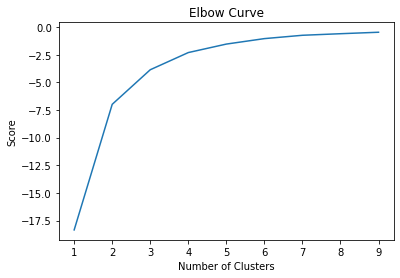

In [51]:
K_clusters = range(1,10)
kmeans = [KMeans(n_clusters=i) for i in K_clusters]
Y_axis = result[['Latitude']]
X_axis = result[['Longitude']]
score = [kmeans[i].fit(Y_axis).score(Y_axis) for i in range(len(kmeans))]
# Visualize
plt.plot(K_clusters, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

We see in the graph that the curves goes slowly after a number of cluster of 3 or 4, which means after this point it will not be useful to increase the numbers of clusters 

#### Launching the algorithm

In [52]:
kmeans = KMeans(n_clusters = 4, init ='k-means++') # chosing 4 as the number of clusters
kmeans.fit(X[X.columns[1:3]]) # Compute k-means clustering on the subset we decided to take above called "X"
X['cluster_label'] = kmeans.fit_predict(X[X.columns[1:3]])
centers = kmeans.cluster_centers_ # Coordinates of cluster centers.
labels = kmeans.predict(X[X.columns[1:3]]) # Labels of each point
X.head(10)

,ID,Latitude,Longitude,cluster_label
8,3682980,48.876750,2.599939,2
22,3685930,48.856070,2.461619,2
23,3685931,48.856522,2.466782,2
24,3685974,48.856160,2.460992,2
63,7311988,48.829815,2.649240,2
64,7311989,48.829375,2.648802,2
70,7312075,48.811911,2.303724,1
72,7312103,48.812981,2.369711,1
88,7512855,48.896429,2.281247,3
89,7512869,48.920788,2.270665,3


#### Plotting the results

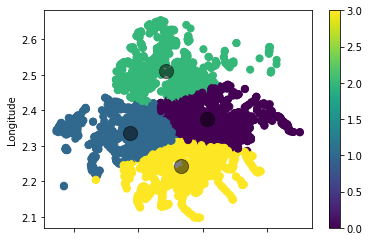

In [53]:
X.plot.scatter(x = 'Latitude', y = 'Longitude', c=labels, s=50, cmap='viridis')
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5)

#### We will now merge the dataframes results and X into a new dataframe  - taking out latitude and longitude to avoid duplicate columns with result dataframe

In [54]:
X = X[['ID','cluster_label']]
X.head(5)

,ID,cluster_label
8,3682980,2
22,3685930,2
23,3685931,2
24,3685974,2
63,7311988,2


#### Merging the dataframes

In [55]:
clustered_data = result.merge(X, left_on='ID', right_on='ID')
clustered_data.head(5)

,ID,Name,Description,Coordinates,Latitude,Longitude,cluster_label
0,3682980,DISPENSAIRE,FACE 39 RUE DE LA LIBERTE - 77108,"48.8767496173,2.59993914757",48.876750,2.599939,2
1,3685930,VEDRINES,54 AVENUE ERNEST RENAN - 94033,"48.8560696327,2.46161860012",48.856070,2.461619,2
2,3685931,ERNEST RENAN,172-174 AVENUE ERNEST RENAN - 93048,"48.8565224898,2.46678170321",48.856522,2.466782,2
3,3685974,VEDRINES,23 AVENUE ERNEST RENAN - 93048,"48.8561601595,2.4609922971",48.856160,2.460992,2
4,7311988,LES PLATANES,ALL DES PLATANES - 77146,"48.8298147009,2.64923984584",48.829815,2.649240,2


#### Best 4 localisation to open a restaurant - centers of clusters of the algorithm

In [56]:
centers = kmeans.cluster_centers_
print(centers)

[[48.90689856  2.37580083]
 [48.7876683   2.33642392]
 [48.84284327  2.50954502]
 [48.866706    2.24231803]]


#### Doing a reverse geocoding in order to find the places that we got from centers


In [58]:

!pip install reverse_geocoder

import reverse_geocoder as rg 



In [59]:
coordinates_center = (48.86647257, 2.24221891), (48.90685781, 2.37616476), (48.78778046, 2.33707742),(48.84232863, 2.51082987)
rg.search(coordinates_center)

[OrderedDict([('lat', '48.87143'),
              ('lon', '2.22929'),
              ('name', 'Suresnes'),
              ('admin1', 'Ile-de-France'),
              ('admin2', 'Departement des Hauts-de-Seine'),
              ('cc', 'FR')]),
 OrderedDict([('lat', '48.91667'),
              ('lon', '2.38333'),
              ('name', 'Aubervilliers'),
              ('admin1', 'Ile-de-France'),
              ('admin2', 'Departement de Seine-Saint-Denis'),
              ('cc', 'FR')]),
 OrderedDict([('lat', '48.78333'),
              ('lon', '2.33333'),
              ('name', "L'Hay-les-Roses"),
              ('admin1', 'Ile-de-France'),
              ('admin2', 'Departement du Val-de-Marne'),
              ('cc', 'FR')]),
 OrderedDict([('lat', '48.85'),
              ('lon', '2.5'),
              ('name', 'Le Perreux-sur-Marne'),
              ('admin1', 'Ile-de-France'),
              ('admin2', 'Departement du Val-de-Marne'),
              ('cc', 'FR')])]

# Discussion

#### Data choice

I first decided to go with a subset of the whole data ( 25000 lines was too much ) , but then i decided to do half the work with the whole dataset. That is why for the first folium map we have all data points but for the second we remove even more duplicates juste on the name of the station. One station can have multiple entrance*. The goal of this was also to simplify the number of request to foursquare, indeed I had ***quota exceed errors*** because i made too many calls

The data was taken since for each station we have a localisation point, it was also easier to use a CSV rather than using the geopy api to find specific coordinates

#### Foursquare API

I had issue due to the maximum number of calls, i had to diminish the number of lines ( from 25.000 to 5.000) and i couldn't work everyday since the number of calls is per day. I decided to simplify the process with the steps you saw before

#### Folium 

Folium and the map was used to understand the data as exploratory analysis since we only have localisation points in this data, nothing else

#### Algorithm 

The k-mean algorithm was able to give us centroid to open a business in a very efficient way
Even if we used k-mean, we may need to have a more specific view based on neighborhood in order to find the best locations per neighborhood, because even if this process show the well used k-mean, the input data may not be the best because now we have positions based on a big radius of more than 15 kms.

# Results

After the analysis i find the results unsettling.

    - The open data itself is interesting but it do not seem exhaustive since some stations are not in the dataset
    
    
Finally,

    - We we able to plot all the stations on the folium map
    - We were able to plot the stations that had a higher number of food venues
    - We were able  to understand which points were more suitable for business opening in terms of transport system accessibility by using the k-mean algorithm

# Conclusion

For the scope of this course assigment we won't go further in this analysis, I believe we went trough all the different topics except inferential statistics which seem difficult considering the type of data we are facing

Some work needs to be done on the following points 

    - Find more data sources and joining them to have a better base dataset
    - Using a professional account of foursquare to get all categories for all the localisation points
    - Finding a France dataset to be able to extend this analysis to France and not only to one city like Paris
    - Seperating the stations by bus, metro, RER...

# REPORT FORMAT

The report will be accessible on github by pdf